In [9]:
import os
import random
import numpy as np
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

In [10]:
# Path to the dataset and annotation directories
dataset_dir = r"C:\objectdetection\dataset"
annotations_dir = r"C:\objectdetection\annotations"


In [11]:
# Function to parse annotation
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    objects = []
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        objects.append((xmin, ymin, xmax, ymax))
    return objects

In [12]:
# Function to plot image with ground truth bounding boxes
def plot_ground_truth(image, ground_truth_boxes, category):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    ax.set_title("Ground Truth")
    for xmin, ymin, xmax, ymax in ground_truth_boxes:
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='g', facecolor='none')
        ax.add_patch(rect)
        print(f"Ground Truth Box {i+1} coordinates: xmin={xmin}, ymin={ymin}, xmax={xmax}, ymax={ymax}")
    plt.show()


In [13]:
# Function to plot image with distorted bounding boxes
def plot_distorted_boxes(image, distorted_boxes, category):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    ax.set_title("Distorted Boxes")
    for xmin, ymin, w, h in distorted_boxes:
        rect = patches.Rectangle((xmin, ymin), w, h, linewidth=1, edgecolor='b', facecolor='none')
        ax.add_patch(rect)
    plt.show()

In [14]:
# Function to plot image after NMS
def plot_nms_boxes(image, nms_boxes, category):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    ax.set_title("NMS Boxes")
    for xmin, ymin, w, h in nms_boxes:
        rect = patches.Rectangle((xmin, ymin), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        print(f"NMS Box {i+1} coordinates: xmin={xmin}, ymin={ymin}, width={w}, height={h}")
    plt.show()

In [15]:
# Step 4: Calculate mAP (IoU calculation)
def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    xmin_inter = max(x1, x2)
    ymin_inter = max(y1, y2)
    xmax_inter = min(x1 + w1, x2 + w2)
    ymax_inter = min(y1 + h1, y2 + h2)

    inter_area = max(0, xmax_inter - xmin_inter + 1) * max(0, ymax_inter - ymin_inter + 1)

    box1_area = (w1 + 1) * (h1 + 1)
    box2_area = (w2 + 1) * (h2 + 1)

    iou = inter_area / float(box1_area + box2_area - inter_area)
    return iou


In [16]:
def calculate_mAP(ground_truth, predicted):
    precisions = []
    recalls = []
    ious = []

    for box_gt in ground_truth:
        best_iou = 0.0
        for box_pred in predicted:
            iou = calculate_iou(box_gt[:4], box_pred[:4])
            if iou > best_iou:
                best_iou = iou
        ious.append(best_iou)

    tp = sum([1 if iou > 0.5 else 0 for iou in ious])
    fp = len(predicted) - tp
    fn = len(ground_truth) - tp

    precision = tp / (tp + fp + np.finfo(float).eps)
    recall = tp / (tp + fn + np.finfo(float).eps)

    return precision, recall


In [17]:
# Step 5: Implement NMS
def non_max_suppression(boxes, iou_threshold=0.5):
    if len(boxes) == 0:
        return []

    print("Before sorting:", boxes)  # Print the content of the boxes list before sorting
    # Sort the boxes by confidence score if available
    if len(boxes[0]) >= 5:
        boxes = sorted(boxes, key=lambda x: x[4], reverse=True)
    selected_boxes = []
    while len(boxes) > 0:
        best_box = boxes[0]
        selected_boxes.append(best_box)
        ious = [calculate_iou(best_box[:4], box[:4]) for box in boxes[1:]]
        boxes = [box for i, box in enumerate(boxes[1:]) if ious[i] <= iou_threshold]
    return selected_boxes

In [18]:
# Function to generate distorted bounding boxes
def generate_distorted_boxes(ground_truth_boxes, num_distorted_boxes=5):
    distorted_boxes = []
    for box in ground_truth_boxes:
        xmin, ymin, xmax, ymax = box
        for _ in range(num_distorted_boxes):
            # Randomly distort the bounding box
            distorted_xmin = xmin + random.randint(-20, 20)
            distorted_ymin = ymin + random.randint(-20, 20)
            w = xmax - distorted_xmin
            h = ymax - distorted_ymin
            distorted_boxes.append((distorted_xmin, distorted_ymin, w, h))
    return distorted_boxes

Ground Truth Box 1 coordinates: xmin=19, ymin=33, xmax=485, ymax=350


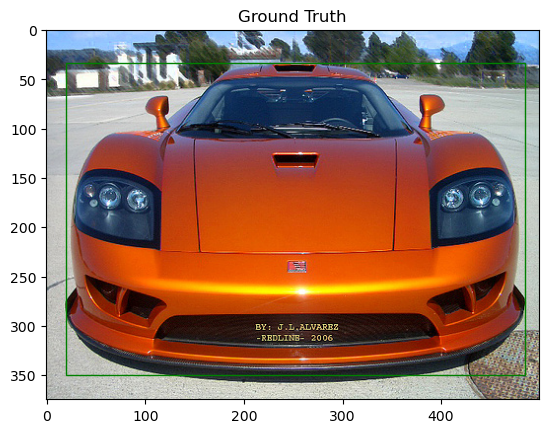

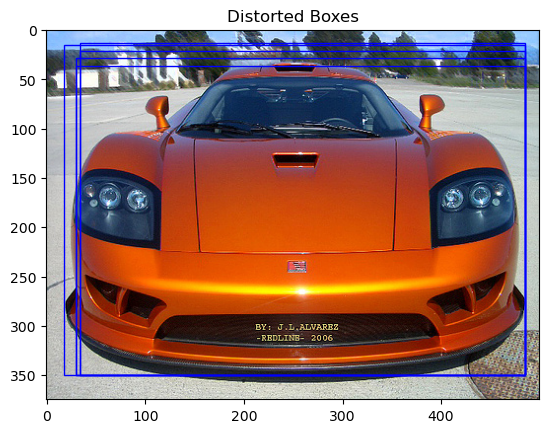

Before sorting: [(34, 13, 451, 337), (30, 36, 455, 314), (17, 15, 468, 335), (30, 28, 455, 322), (34, 21, 451, 329)]
NMS Box 1 coordinates: xmin=34, ymin=13, width=451, height=337


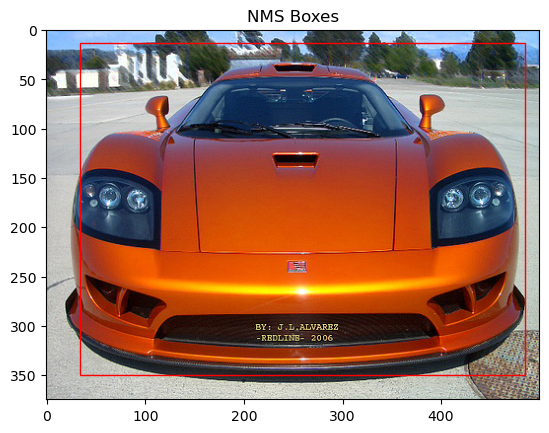

Ground Truth Box 2 coordinates: xmin=104, ymin=132, xmax=360, ymax=254


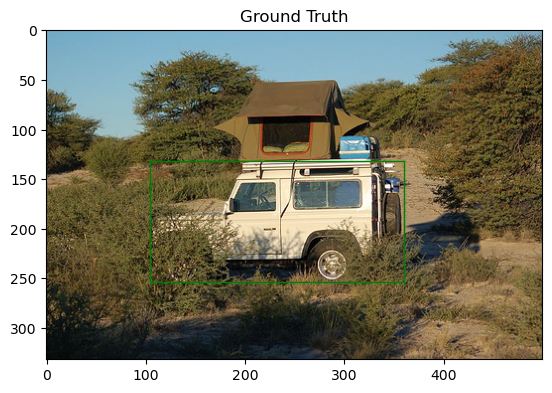

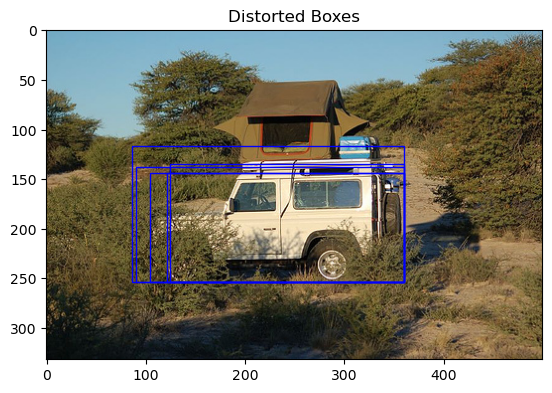

Before sorting: [(90, 138, 270, 116), (121, 144, 239, 110), (86, 117, 274, 137), (104, 144, 256, 110), (124, 135, 236, 119)]
NMS Box 2 coordinates: xmin=90, ymin=138, width=270, height=116


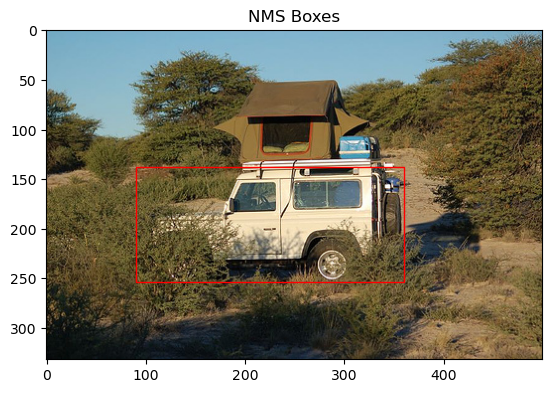

Ground Truth Box 3 coordinates: xmin=16, ymin=120, xmax=389, ymax=218
Ground Truth Box 3 coordinates: xmin=161, ymin=72, xmax=485, ymax=158


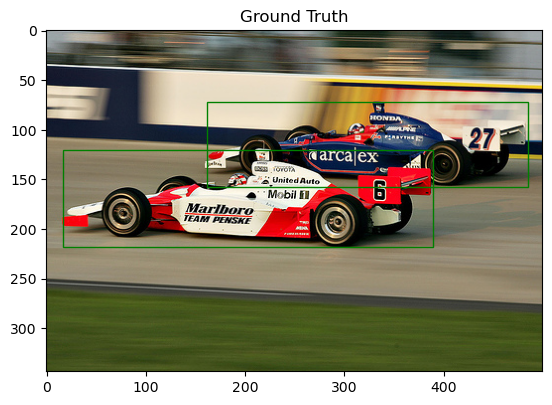

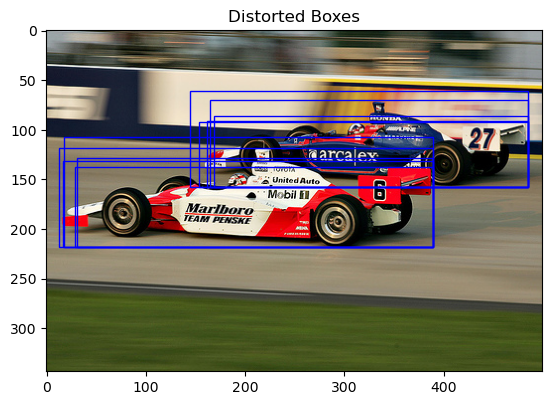

Before sorting: [(30, 128, 359, 90), (16, 132, 373, 86), (12, 118, 377, 100), (28, 138, 361, 80), (17, 107, 372, 111), (153, 92, 332, 66), (161, 91, 324, 67), (144, 61, 341, 97), (164, 70, 321, 88), (169, 86, 316, 72)]
NMS Box 3 coordinates: xmin=30, ymin=128, width=359, height=90
NMS Box 3 coordinates: xmin=153, ymin=92, width=332, height=66


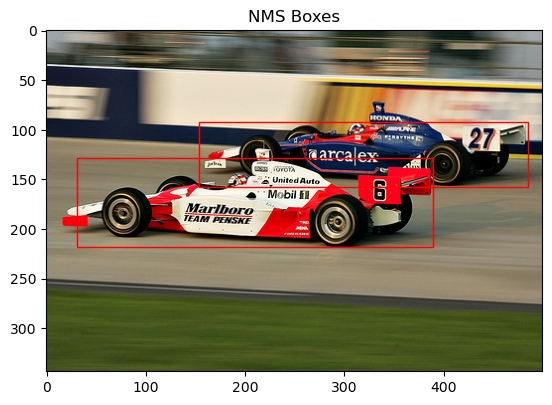

Ground Truth Box 4 coordinates: xmin=84, ymin=2, xmax=486, ymax=366


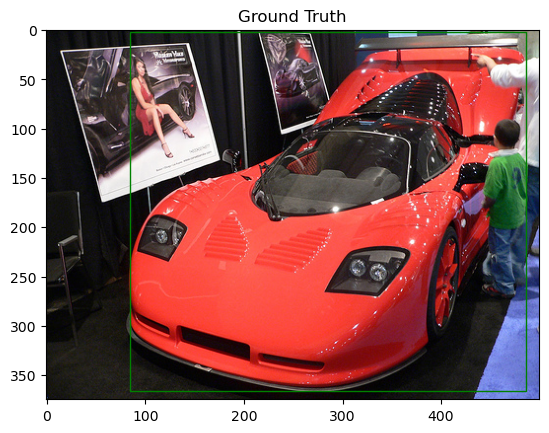

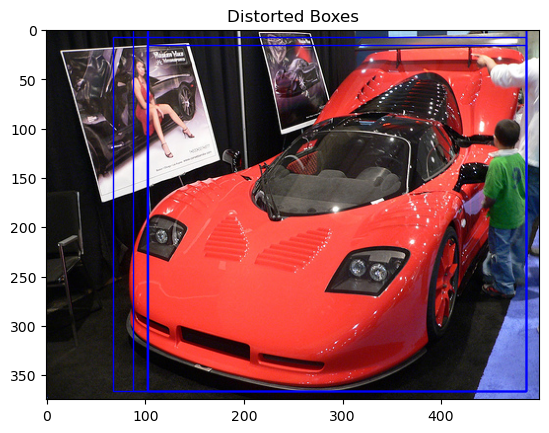

Before sorting: [(102, 15, 384, 351), (102, -2, 384, 368), (87, -8, 399, 374), (103, -2, 383, 368), (67, 7, 419, 359)]
NMS Box 4 coordinates: xmin=102, ymin=15, width=384, height=351


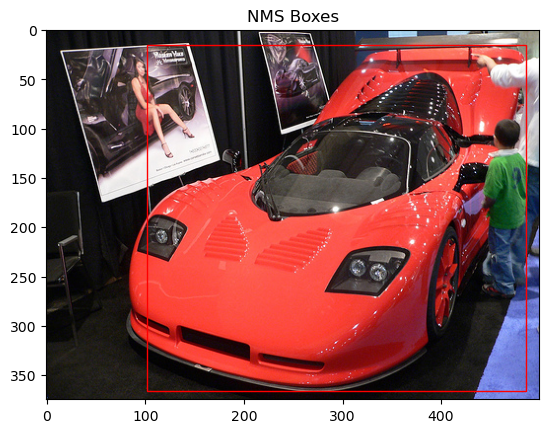

Ground Truth Box 5 coordinates: xmin=9, ymin=22, xmax=477, ymax=264


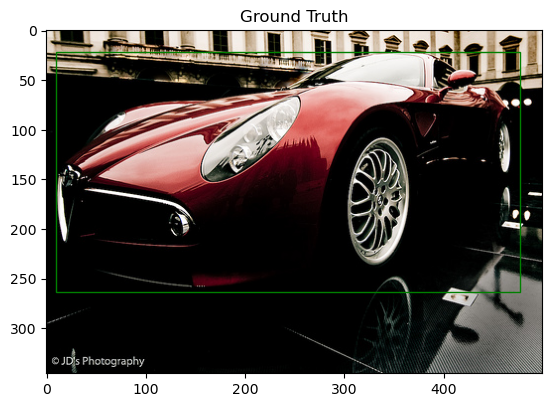

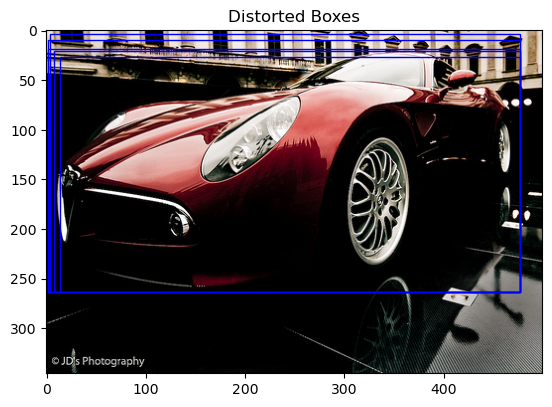

Before sorting: [(3, 3, 474, 261), (1, 10, 476, 254), (7, 21, 470, 243), (1, 19, 476, 245), (13, 27, 464, 237)]
NMS Box 5 coordinates: xmin=3, ymin=3, width=474, height=261


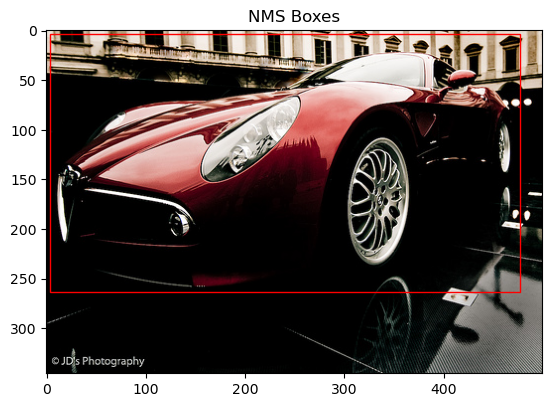

Ground Truth Box 6 coordinates: xmin=105, ymin=147, xmax=372, ymax=243


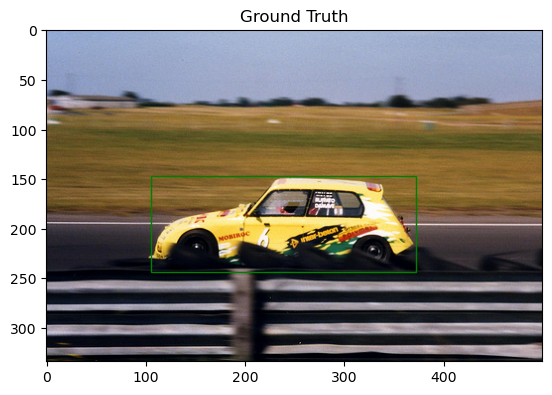

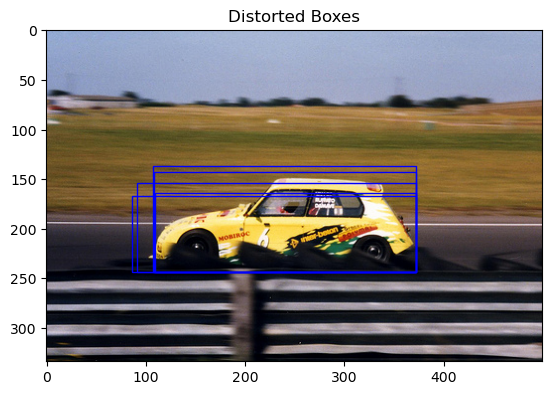

Before sorting: [(108, 143, 264, 100), (86, 167, 286, 76), (91, 154, 281, 89), (107, 137, 265, 106), (109, 164, 263, 79)]
NMS Box 6 coordinates: xmin=108, ymin=143, width=264, height=100


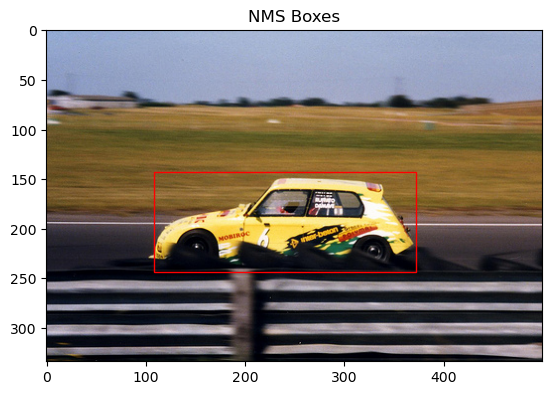

Ground Truth Box 7 coordinates: xmin=29, ymin=101, xmax=537, ymax=363


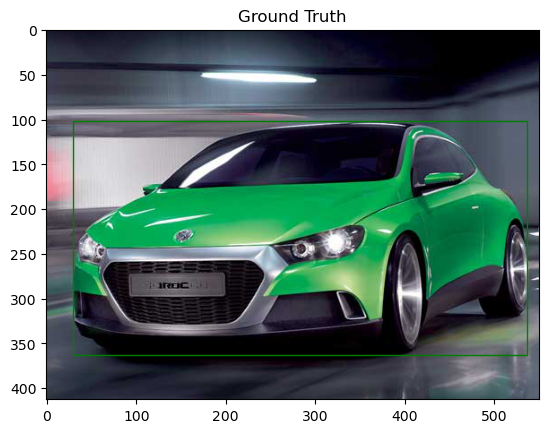

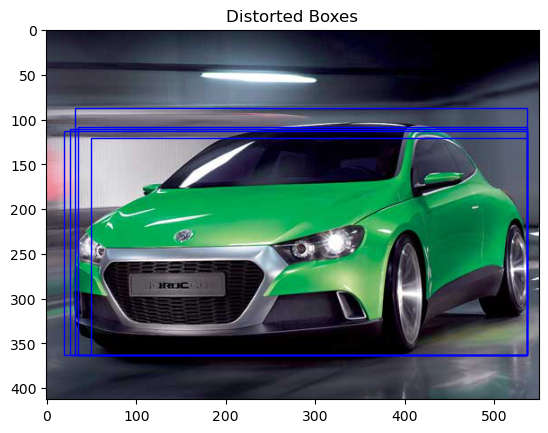

Before sorting: [(26, 110, 511, 253), (31, 87, 506, 276), (35, 108, 502, 255), (19, 113, 518, 250), (49, 121, 488, 242)]
NMS Box 7 coordinates: xmin=26, ymin=110, width=511, height=253


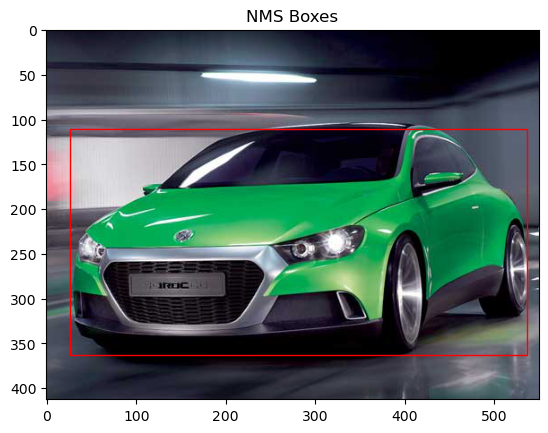

Ground Truth Box 8 coordinates: xmin=81, ymin=110, xmax=421, ymax=218


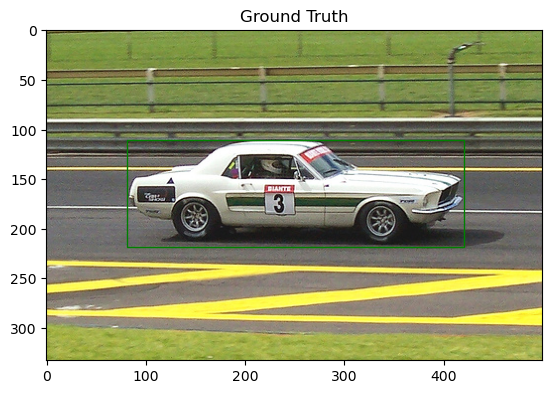

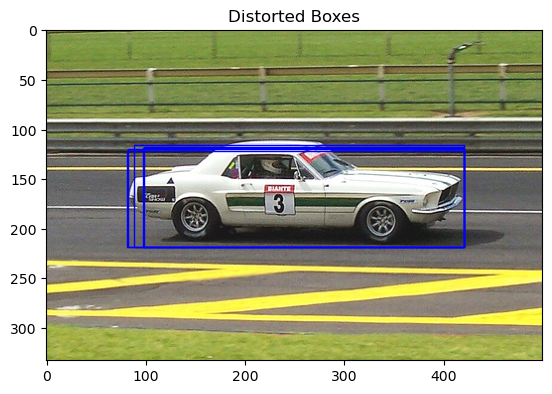

Before sorting: [(82, 120, 339, 98), (97, 119, 324, 99), (88, 115, 333, 103), (81, 122, 340, 96), (98, 118, 323, 100)]
NMS Box 8 coordinates: xmin=82, ymin=120, width=339, height=98


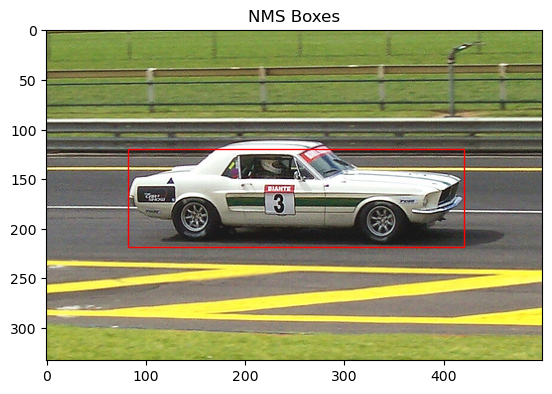

Ground Truth Box 9 coordinates: xmin=168, ymin=167, xmax=325, ymax=238
Ground Truth Box 9 coordinates: xmin=405, ymin=101, xmax=498, ymax=373


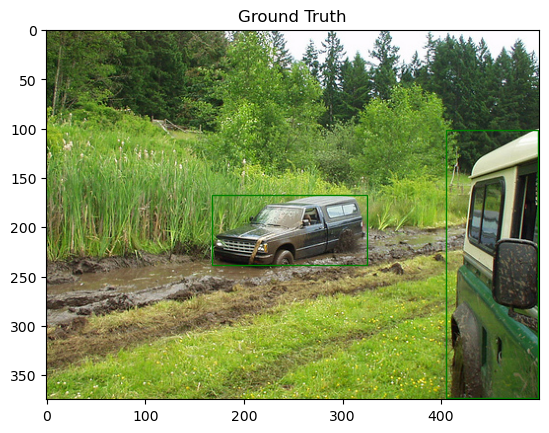

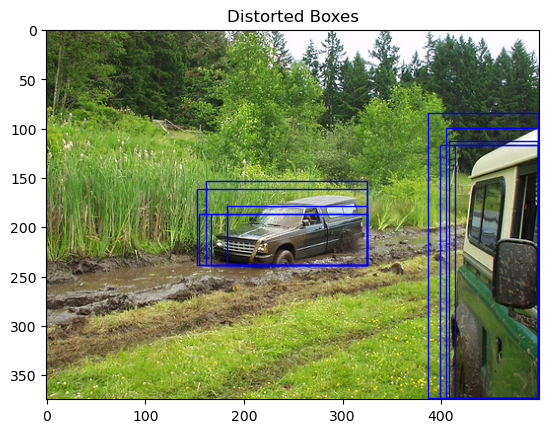

Before sorting: [(167, 187, 158, 51), (154, 187, 171, 51), (183, 178, 142, 60), (152, 161, 173, 77), (161, 153, 164, 85), (414, 117, 84, 256), (387, 84, 111, 289), (405, 99, 93, 274), (408, 112, 90, 261), (399, 116, 99, 257)]
NMS Box 9 coordinates: xmin=167, ymin=187, width=158, height=51
NMS Box 9 coordinates: xmin=414, ymin=117, width=84, height=256


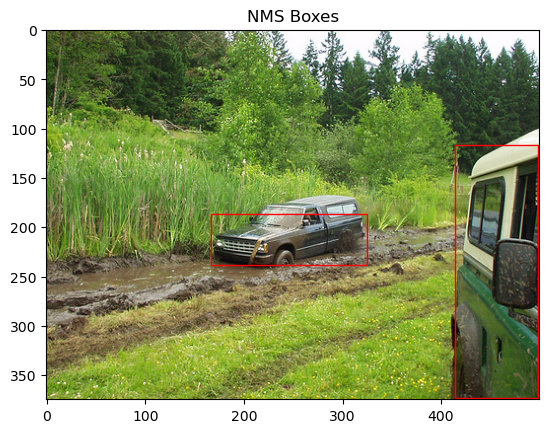

Ground Truth Box 10 coordinates: xmin=2, ymin=0, xmax=478, ymax=289


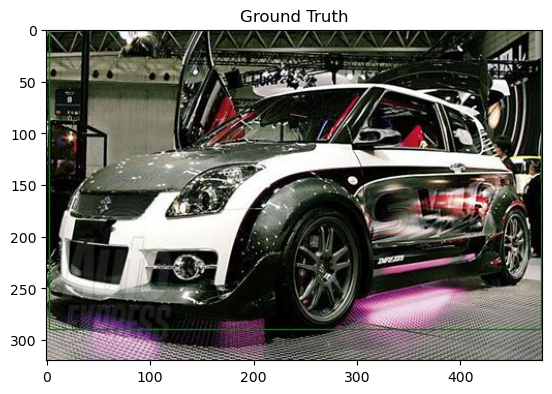

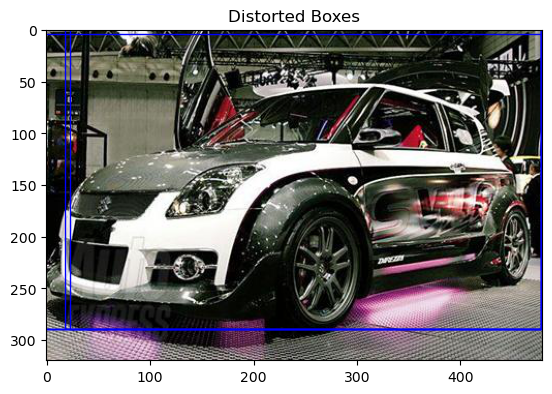

Before sorting: [(-15, 4, 493, 285), (22, -10, 456, 299), (-15, -11, 493, 300), (18, -2, 460, 291), (-3, -2, 481, 291)]
NMS Box 10 coordinates: xmin=-15, ymin=4, width=493, height=285


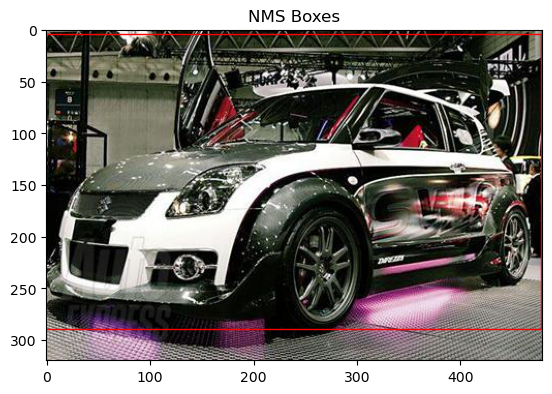

In [19]:
# Selecting three categories
categories = ['jeep', 'racecar', 'sportscar']
# Collect 10 random annotations and their corresponding images
annotations_images = []
for category in categories:
    category_dataset_dir = os.path.join(dataset_dir, category)
    category_annotations_dir = os.path.join(annotations_dir, category)
    
    annotation_files = os.listdir(category_annotations_dir)
    random.shuffle(annotation_files)
    selected_annotations = annotation_files[:10]  # Selecting 10 random annotation files
    for annotation_file in selected_annotations:
        # Load the annotation file
        annotation_path = os.path.join(category_annotations_dir, annotation_file)
        
        # Load the corresponding image file
        image_file = annotation_file.split('.')[0] + '.JPEG'
        image_path = os.path.join(category_dataset_dir, image_file)
        
        # Check if the corresponding image file exists
        if os.path.exists(image_path):
            # Append annotation and image pair
            annotations_images.append((annotation_path, image_path))

# Shuffle the annotations and images
random.shuffle(annotations_images)

# Plot images with ground truth bounding boxes, distorted bounding boxes, and NMS boxes
for i in range(10):
    annotation_path, image_path = annotations_images[i]
    category = os.path.basename(os.path.dirname(annotation_path))  # Extract category from annotation path
      
    # Load the image
    image = Image.open(image_path)
    
    # Parse the annotation file
    ground_truth_boxes = parse_annotation(annotation_path)
    
    # Plot image with ground truth bounding boxes
    plot_ground_truth(image, ground_truth_boxes, category)
    
    # Generate distorted bounding boxes
    distorted_boxes = generate_distorted_boxes(ground_truth_boxes)
    
    plot_distorted_boxes(image,distorted_boxes,category)
    
    # Apply Non-Maximum Suppression (NMS) on distorted boxes
    nms_distorted_boxes = non_max_suppression(distorted_boxes)
    
    # Plot image after NMS
    plot_nms_boxes(image, nms_distorted_boxes, category)
